In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as tvtransforms
import torchvision
import PIL.Image as Image
from glob import glob
from tqdm.notebook import tqdm 
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import matplotlib.pyplot as plt
import numpy as np
import sys
sys.path.insert(0, '/root/fastMRI-master')
import fastmri
from fastmri.data import subsample
from fastmri.data import transforms
from fastmri.models import Unet
from fastmri.losses import SSIMLoss
from fastmri.evaluate import ssim, psnr, nmse

sys.path.insert(0, '/root/workspace/py')
import myutils

import math
from math import ceil, floor
import random

from skimage.draw import line_aa

In [11]:
class ImagenetDataset(Dataset):
    def __init__(self, isval=False):
#         self.files = []
#         pattern   = "*.JPEG"        
#         for dir, _, _ in os.walk('/media/hdd1/ImageNet/ILSVRC/Data/CLS-LOC/train/'):
#             self.files.extend(glob(os.path.join(dir, pattern))) 

        if isval:
            self.files = torch.load('./imagenet_filepaths_val.pt') 
        else:
            self.files = torch.load('./imagenet_filepaths_train.pt')    

        self.transform = tvtransforms.Compose([      
            tvtransforms.Resize(320,),
            tvtransforms.RandomCrop(272),
            tvtransforms.Grayscale(1),
            tvtransforms.RandomVerticalFlip(p=0.5),
            tvtransforms.RandomHorizontalFlip(p=0.5),
            tvtransforms.ToTensor(),                  
            ])            
        
        self.factors = [2, 3, 4, 5, 6, 7, 8, 9, 10]
        
    def get_mask_func(self, samp_style, factor, ):
        center_fractions = 0.08 * 4/factor
        if samp_style == 'random':
            mask_func = subsample.RandomMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor], 
                )
        elif samp_style == 'equidist':
            mask_func = subsample.EquispacedMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor], 
                )            
        return mask_func
        
    def add_gaussian_noise(self, x):
        noise = random.uniform(0.0, 0.0015)
        x = x + noise*x.norm()*1/2**0.5*torch.randn_like(x)

        return x

    def __len__(self, ):
        
        return len(self.files)
    
    def __getitem__(self, idx):
        image = Image.open(self.files[idx]).convert("RGB")
   
        y = self.transform(image)
        
        if random.uniform(0, 1) < 0.5:
            y = torch.rot90(y, 1, [-2,-1])
        
        if random.uniform(0, 1) < 0.5:
            samp_style = 'random'
        else:
            samp_style = 'equidist'
        factor = random.choice(self.factors)
        mask_func = self.get_mask_func(samp_style, factor)
        x = y.squeeze()
        x = torch.stack((x, torch.zeros_like(x)), -1)
        kspace = fastmri.fft2c(x)
        ksapce = self.add_gaussian_noise(kspace)
        masked_kspace, _ = transforms.apply_mask(kspace, mask_func) 
        zero_fill = fastmri.ifft2c(masked_kspace)
        x = fastmri.complex_abs(zero_fill)
        x = x.unsqueeze(0)
        x += 1e-6*torch.randn_like(x)  # For stability during training due to normalization step in network (i.e. when x is constant, network outputs inf)
        
        return (x, y)

In [12]:
dataset = ImagenetDataset()
val_dataset = ImagenetDataset(isval=True)

In [13]:
ntrain = len(dataset)
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [ntrain, len(dataset)-ntrain],generator=torch.Generator().manual_seed(42))

In [14]:
batch_size = 32
trainloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True,generator=torch.Generator().manual_seed(42))
# testloader = DataLoader(test_dataset, batch_size=1, shuffle=True, num_workers=1, pin_memory=True,generator=torch.Generator().manual_seed(42))
valloader = DataLoader(val_dataset, batch_size=1, shuffle=True, num_workers=1, pin_memory=True,generator=torch.Generator().manual_seed(42))

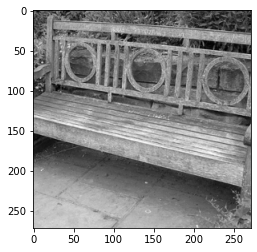

In [15]:
plt.imshow(next(iter(valloader))[1][0][0], cmap='gray')

In [16]:
def positionalencoding2d(d_model, height, width):
    """
    :param d_model: dimension of the model
    :param height: height of the positions
    :param width: width of the positions
    :return: d_model*height*width position matrix
    """
    if d_model % 4 != 0:
        raise ValueError("Cannot use sin/cos positional encoding with "
                         "odd dimension (got dim={:d})".format(d_model))
    pe = torch.zeros(d_model, height, width)
    # Each dimension use half of d_model
    d_model = int(d_model / 2)
    div_term = torch.exp(torch.arange(0., d_model, 2) *
                         -(math.log(10000.0) / d_model))
    pos_w = torch.arange(0., width).unsqueeze(1)
    pos_h = torch.arange(0., height).unsqueeze(1)
    pe[0:d_model:2, :, :] = torch.sin(pos_w * div_term).transpose(0, 1).unsqueeze(1).repeat(1, height, 1)
    pe[1:d_model:2, :, :] = torch.cos(pos_w * div_term).transpose(0, 1).unsqueeze(1).repeat(1, height, 1)
    pe[d_model::2, :, :] = torch.sin(pos_h * div_term).transpose(0, 1).unsqueeze(2).repeat(1, 1, width)
    pe[d_model + 1::2, :, :] = torch.cos(pos_h * div_term).transpose(0, 1).unsqueeze(2).repeat(1, 1, width)

    return pe

positionalencoding2d(16*44, 3, 3 ).shape

torch.Size([704, 3, 3])

In [17]:
   
# Copyright (c) 2015-present, Facebook, Inc.
# All rights reserved.
#
# This source code is licensed under the CC-by-NC license found in the
# LICENSE file in the root directory of this source tree.
#

'''These modules are adapted from those of timm, see
https://github.com/rwightman/pytorch-image-models/blob/master/timm/models/vision_transformer.py
'''

'''
Code based on https://github.com/facebookresearch/convit. With some modifications. Including adaption to image reconsturction, variable input sizes, patch sizes for both dimensions ~Kang
'''

import torch
import torch.nn as nn
from functools import partial
import torch.nn.functional as F
from timm.models.helpers import load_pretrained
from timm.models.layers import DropPath, to_2tuple, trunc_normal_

class Mlp(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, act_layer=nn.GELU, drop=0.):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.act = act_layer()
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop = nn.Dropout(drop)
        self.apply(self._init_weights)
        
    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
            
    def forward(self, x):
        x = self.fc1(x)
        x = self.act(x)
        x = self.drop(x)
        x = self.fc2(x)     
        x = self.drop(x)
        return x


class GPSA(nn.Module):
    def __init__(self, dim, num_heads=8, qkv_bias=False, qk_scale=None, attn_drop=0., proj_drop=0.,
                 locality_strength=1., use_local_init=True, grid_size=None):
        super().__init__()
        self.num_heads = num_heads
        self.dim = dim
        head_dim = dim // num_heads
        self.scale = qk_scale or head_dim ** -0.5

        self.q = nn.Linear(dim, dim, bias=qkv_bias)       
        self.k = nn.Linear(dim, dim, bias=qkv_bias)    
        self.v = nn.Linear(dim, dim, bias=qkv_bias)       
        
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.pos_proj = nn.Linear(3, num_heads)
        self.proj_drop = nn.Dropout(proj_drop)
        self.locality_strength = locality_strength
        self.gating_param = nn.Parameter(1*torch.ones(self.num_heads))
        self.apply(self._init_weights)
        if use_local_init:
            self.local_init(locality_strength=locality_strength)
        self.current_grid_size = grid_size
        
    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        
    def get_attention(self, x):
        B, N, C = x.shape  

        k = self.k(x).reshape(B, N, self.num_heads, C // self.num_heads).permute(0, 2, 1, 3) 
        q = self.q(x).reshape(B, N, self.num_heads, C // self.num_heads).permute(0, 2, 1, 3)            

        pos_score = self.pos_proj(self.rel_indices).expand(B, -1, -1,-1).permute(0,3,1,2)
        patch_score = (q @ k.transpose(-2, -1)) * self.scale
        patch_score = patch_score.softmax(dim=-1)
        pos_score = pos_score.softmax(dim=-1)

        gating = self.gating_param.view(1,-1,1,1)
        attn = (1.-torch.sigmoid(gating)) * patch_score + torch.sigmoid(gating) * pos_score
        attn = attn / attn.sum(dim=-1).unsqueeze(-1) 
        attn = self.attn_drop(attn)
        return attn

    def get_attention_map(self, x, return_map = False):

        attn_map = self.get_attention(x).mean(0) # average over batch
        distances = self.rel_indices.squeeze()[:,:,-1]**.5
        dist = torch.einsum('nm,hnm->h', (distances, attn_map))
        dist /= distances.size(0)
        if return_map:
            return dist, attn_map
        else:
            return dist
    
    def local_init(self, locality_strength=1.):
        
        self.v.weight.data.copy_(torch.eye(self.dim))
        locality_distance = 1 #max(1,1/locality_strength**.5)
        
        kernel_size = int(self.num_heads**.5)
        center = (kernel_size-1)/2 if kernel_size%2==0 else kernel_size//2
        for h1 in range(kernel_size):
            for h2 in range(kernel_size):
                position = h1+kernel_size*h2
                self.pos_proj.weight.data[position,2] = -1
                self.pos_proj.weight.data[position,1] = 2*(h1-center)*locality_distance
                self.pos_proj.weight.data[position,0] = 2*(h2-center)*locality_distance
        self.pos_proj.weight.data *= locality_strength

    def get_rel_indices(self, ):
        H, W = self.current_grid_size
        N = H*W
        rel_indices = torch.zeros(1, N, N, 3)
        indx = torch.arange(W).view(1,-1) - torch.arange(W).view(-1, 1)
        indx = indx.repeat(H, H)
        indy = torch.arange(H).view(1,-1) - torch.arange(H).view(-1, 1)
        indy = indy.repeat_interleave(W, dim=0).repeat_interleave(W, dim=1)
        indd = indx**2 + indy**2
        rel_indices[:,:,:,2] = indd.unsqueeze(0)
        rel_indices[:,:,:,1] = indy.unsqueeze(0)
        rel_indices[:,:,:,0] = indx.unsqueeze(0)
        device = self.v.weight.device
        self.rel_indices = rel_indices.to(device)
        
    def forward(self, x):
        B, N, C = x.shape
        if not hasattr(self, 'rel_indices') or self.rel_indices.size(1)!=N:
            self.get_rel_indices()

        attn = self.get_attention(x)
        v = self.v(x).reshape(B, N, self.num_heads, C // self.num_heads).permute(0, 2, 1, 3)
        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)
        return x
        
class MHSA(nn.Module):
    def __init__(self, dim, num_heads=8, qkv_bias=False, qk_scale=None, attn_drop=0., proj_drop=0., grid_size=None):
        super().__init__()
        self.num_heads = num_heads
        head_dim = dim // num_heads
        self.scale = qk_scale or head_dim ** -0.5

        self.qkv = nn.Linear(dim, dim * 3, bias=qkv_bias)
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.proj_drop = nn.Dropout(proj_drop)
        self.apply(self._init_weights)
        self.current_grid_size = grid_size
        
    def _init_weights(self, m):        
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)

    def get_attention_map(self, x, return_map = False):
        self.get_rel_indices()
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]
        attn_map = (q @ k.transpose(-2, -1)) * self.scale
        attn_map = attn_map.softmax(dim=-1).mean(0) # average over batch
        distances = self.rel_indices.squeeze()[:,:,-1]**.5
        dist = torch.einsum('nm,hnm->h', (distances, attn_map))
        dist /= distances.size(0)
        if return_map:
            return dist, attn_map
        else:
            return dist
        
    def get_rel_indices(self, ):
        H, W = self.current_grid_size
        N = H*W
        rel_indices = torch.zeros(1, N, N, 3)
        indx = torch.arange(W).view(1,-1) - torch.arange(W).view(-1, 1)
        indx = indx.repeat(H, H)
        indy = torch.arange(H).view(1,-1) - torch.arange(H).view(-1, 1)
        indy = indy.repeat_interleave(W, dim=0).repeat_interleave(W, dim=1)
        indd = indx**2 + indy**2
        rel_indices[:,:,:,2] = indd.unsqueeze(0)
        rel_indices[:,:,:,1] = indy.unsqueeze(0)
        rel_indices[:,:,:,0] = indx.unsqueeze(0)
        device = self.qkv.weight.device
        self.rel_indices = rel_indices.to(device)                

            
    def forward(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]

        attn = (q @ k.transpose(-2, -1)) * self.scale
        attn = attn.softmax(dim=-1)
        attn = self.attn_drop(attn)

        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)
        
        return x
    
class Block(nn.Module):
    def __init__(self, dim, num_heads,  mlp_ratio=4., qkv_bias=False, qk_scale=None, drop=0., attn_drop=0.,
                 drop_path=0., act_layer=nn.GELU, norm_layer=nn.LayerNorm, use_gpsa=True, **kwargs):
        super().__init__()
        self.norm1 = norm_layer(dim)
        self.use_gpsa = use_gpsa
        if self.use_gpsa:
            self.attn = GPSA(dim, num_heads=num_heads, qkv_bias=qkv_bias, qk_scale=qk_scale, attn_drop=attn_drop, proj_drop=drop, **kwargs)
        else:
            self.attn = MHSA(dim, num_heads=num_heads, qkv_bias=qkv_bias, qk_scale=qk_scale, attn_drop=attn_drop, proj_drop=drop, **kwargs)
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.norm2 = norm_layer(dim)
        mlp_hidden_dim = int(dim * mlp_ratio)
        self.mlp = Mlp(in_features=dim, hidden_features=mlp_hidden_dim, act_layer=act_layer, drop=drop)

    def forward(self, x, grid_size):
        self.attn.current_grid_size = grid_size
        x = x + self.drop_path(self.attn(self.norm1(x)))
        x = x + self.drop_path(self.mlp(self.norm2(x)))
        
        return x
    
class PatchEmbed(nn.Module):
    """ Image to Patch Embedding, from timm
    """
    def __init__(self, patch_size, in_chans, embed_dim):
        super().__init__()
        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)      
        self.apply(self._init_weights)
        
    def forward(self, x):
        x = self.proj(x)

        return x
    
    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
            
class VisionTransformer(nn.Module):
    """ Vision Transformer
    """
    def __init__(self, avrg_img_size=320, patch_size=16, in_chans=1, embed_dim=64, depth=8,
                 num_heads=9, mlp_ratio=4., qkv_bias=False, qk_scale=None, drop_rate=0., attn_drop_rate=0.,
                 drop_path_rate=0., norm_layer=nn.LayerNorm, global_pool=None,
                 gpsa_interval=(2,7), locality_strength=1., use_pos_embed=True):
        
        super().__init__()
        self.depth = depth
        embed_dim *= num_heads
        self.num_features = embed_dim  # num_features for consistency with other models
        self.locality_strength = locality_strength
        self.use_pos_embed = use_pos_embed

        if isinstance(avrg_img_size, int):
            img_size = to_2tuple(avrg_img_size)

        if isinstance(patch_size, int):
            self.patch_size = to_2tuple(patch_size)
        else:
            self.patch_size = patch_size

        self.in_chans = in_chans
        
        self.patch_embed = PatchEmbed(
            patch_size=self.patch_size, in_chans=in_chans, embed_dim=embed_dim)
            
        self.pos_drop = nn.Dropout(p=drop_rate)
        
        if self.use_pos_embed:
            self.pos_embed = nn.Parameter(
                torch.zeros(1, embed_dim,
                    img_size[0] // self.patch_size[0],
                    img_size[1] // self.patch_size[1])
                )
            
            trunc_normal_(self.pos_embed, std=.02)

        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, depth)]  # stochastic depth decay rule
                
        self.blocks = nn.ModuleList([
            Block(
                dim=embed_dim, num_heads=num_heads, mlp_ratio=mlp_ratio, qkv_bias=qkv_bias, qk_scale=qk_scale,
                drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[i], norm_layer=norm_layer,
                use_gpsa=True,
                locality_strength=locality_strength)
            if i>=gpsa_interval[0]-1 and i<gpsa_interval[1] else            
            Block(
                dim=embed_dim, num_heads=num_heads, mlp_ratio=mlp_ratio, qkv_bias=qkv_bias, qk_scale=qk_scale,
                drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[i], norm_layer=norm_layer,
                use_gpsa=False,)
            for i in range(depth)])
                
        self.norm = norm_layer(embed_dim)

        # head
        self.feature_info = [dict(num_chs=embed_dim, reduction=0, module='head')]
        self.head = nn.Linear(self.num_features, in_chans*self.patch_size[0]*self.patch_size[1]) 
        
    def seq2img(self, x, img_size):
        """
        Transforms sequence back into image space, input dims: [batch_size, num_patches, channels]
        output dims: [batch_size, channels, H, W]
        """
        x = x.view(x.shape[0], x.shape[1], self.in_chans, self.patch_size[0], self.patch_size[1])
        x = x.chunk(x.shape[1], dim=1)
        x = torch.cat(x, dim=4).permute(0,1,2,4,3)
        x = x.chunk(img_size[0]//self.patch_size[0], dim=3)
        x = torch.cat(x, dim=4).permute(0,1,2,4,3).squeeze(1)
            
        return x     

        self.head.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)

    @torch.jit.ignore
    def no_weight_decay(self,):
        return {'pos_embed'}

    def get_head(self,):
        return self.head

    def reset_head(self,):
        self.head = nn.Linear(self.num_features, in_chans*self.patch_size[0]*self.patch_size[1]) 

    def forward_features(self, x, k=None):
        x = self.patch_embed(x)
        _, _, H, W = x.shape
        
        if self.use_pos_embed:
            pos_embed = F.interpolate(self.pos_embed, size=[H, W], mode='bilinear', align_corners = False)
            x = x + pos_embed
            
        x = x.flatten(2).transpose(1, 2)
        x = self.pos_drop(x)

        for u, blk in enumerate(self.blocks):
            x = blk(x, (H, W))
            if k is not None and u == k:
                self.attention_map = blk.attn.get_attention_map(x, return_map = True)
                
        x = self.norm(x)  

        return x

    def forward(self, x, k=None):
        _, _, H, W = x.shape
        x = self.forward_features(x, k)
        x = self.head(x)
        x = self.seq2img(x, (H, W))
        
        return x
    
import torch.nn as nn
import torch.nn.functional as F
from math import ceil, floor
from fastmri.models import Unet

class ReconNet(nn.Module):
    def __init__(self, net):
        super().__init__()
        self.net = net

    def pad(self, x):
        _, _, h, w = x.shape
        hp, wp = self.net.patch_size
        f1 = ( (wp - w % wp) % wp ) / 2
        f2 = ( (hp - h % hp) % hp ) / 2
        wpad = [floor(f1), ceil(f1)]
        hpad = [floor(f2), ceil(f2)]
        x = F.pad(x, wpad+hpad)
        
        return x, wpad, hpad
    
    def unpad(self, x, wpad, hpad):
        
        return x[..., hpad[0] : x.shape[-2]-hpad[1], wpad[0] : x.shape[-1]-wpad[1]]       
    
    def norm(self, x):
        mean = x.view(x.shape[0], 1, 1, -1).mean(-1, keepdim=True)
        std = x.view(x.shape[0], 1, 1, -1,).std(-1, keepdim=True)
        x = (x-mean)/std

        return x, mean, std

    def unnorm(self, x, mean, std):
        
        return x * std + mean
    
    def vit_forward(self, x, k=None):         
        x, wpad, hpad = self.pad(x)
        x, mean, std = self.norm(x)
        x = self.net(x, k)
        x = self.unnorm(x, mean, std)
        x = self.unpad(x, wpad, hpad)

        return x
    
    def unet_forward(self, x):    
        x, mean, std = self.norm(x)    
        x = self.net(x)
        x = self.unnorm(x, mean, std)        

        return x    
    
    def forward(self, x, k=None):
        if isinstance(self.net, Unet):
            
            return self.unet_forward(x)
        else:
            
            return self.vit_forward(x, k)    

In [18]:
device = 'cuda'
img_size = 272
patch_size = 10
depth = 10
num_heads = 16
# gpsa_interval = [2, depth-1]
gpsa_interval = [-1, -1]
net = VisionTransformer(
    avrg_img_size=img_size, 
    patch_size=patch_size, 
    in_chans=1, embed_dim=44, 
    depth=depth, num_heads=num_heads, mlp_ratio=4., 
    gpsa_interval=gpsa_interval, locality_strength=1, 
    use_pos_embed=True, qkv_bias=False,
    )

model = ReconNet(net).to(device)
# net = Unet(
#     in_chans=1,
#     out_chans=1,
#     chans=32,
#     num_pool_layers=4,
#     )
# model = ReconNet(net).to(device)

# checkpoint = torch.load('./Models/imgnet_pretrain_150M.pth')
# model = checkpoint['model']
# model.load_state_dict(checkpoint['model_state_dict'],)
# model = model.to(device)        

# Unbiased model
for name, param in model.named_parameters():
    if name.endswith('.bias'):
        nn.init.constant_(param, 0)
        param.requires_grad = False
            
    

print('#Params:', sum(p.numel() for p in model.parameters() if p.requires_grad))

#Params: 60142720


In [19]:
"""Choose optimizer"""
criterion = SSIMLoss().to(device)
# ssimloss = SSIMLoss().to(device)

# criterion = nn.L1Loss()
# l1loss = nn.L1Loss()

# def criterion(y, target, maxval):
#     return ssimloss(y, target, maxval)*l1loss(y, target)

optimizer = optim.Adam(model.parameters(), lr=0.0005, weight_decay=0.00)
train_hist = []
# scheduler = optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.0005,
#                                           total_steps=40, pct_start=0.1,
#                                           anneal_strategy='linear',
#                                           cycle_momentum=False,
#                                           base_momentum=0., max_momentum=0., div_factor=0.1*40, final_div_factor=9)

In [28]:
optimizer.param_groups[0]['lr'] = 0.0001

In [ ]:
"""Train VISION TRANSFORMER"""
epoch_fac = 1
for epoch in tqdm(range(0, 10*epoch_fac)):  # loop over the dataset multiple times
    model.train()
    
    print(optimizer.param_groups[0]['lr'])      
    train_loss = 0.0
    with tqdm(total=len(trainloader)) as pbar:
        for i, data in enumerate(trainloader):
            inputs, targets = data
            optimizer.zero_grad()
            outputs = model(inputs.to(device))
            loss = criterion(outputs, targets.to(device), torch.tensor([1.], device=device))
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=1, norm_type=1, error_if_nonfinite=True)
            optimizer.step()
            pbar.update(1)

            train_loss += loss.item()

#     scheduler.step()
    train_hist.append(train_loss/len(trainloader))
    print('Epoch {}, Train loss.: {:0.4e}'.format(epoch+1, train_hist[-1]))
    

  0%|          | 0/10 [00:00<?, ?it/s]

0.0005


  0%|          | 0/40037 [00:00<?, ?it/s]

In [31]:
train_hist

[0.269298104695347,
 0.23104889608809268,
 0.22135380264267887,
 0.21607027943920304,
 0.21190982024730448,
 0.2093791596124939,
 0.20710029412712952,
 0.20566975785459402,
 0.2042844933128638,
 0.2032128813148429,
 0.19984748964975219,
 0.19905702788551646,
 0.19854569122782179,
 0.19809161836034986,
 0.19543618443760358,
 0.19493993928085468]

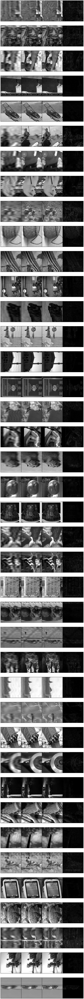

In [32]:
"""Qualitative Performance"""
# valloader = DataLoader(val_dataset, batch_size=1, shuffle=True, num_workers=0,generator=torch.Generator().manual_seed(40))
maxval = torch.tensor([1.], device='cpu')
dataiter = iter(valloader)
model.eval()
plt.figure(figsize=(20,240))
with torch.no_grad():
    for k in range(0,40):    
        inputs, targets = dataiter.next()
        outputs = model(inputs.to(device)).cpu()
        inputs_ = inputs
        plt.subplot(40,1,k+1)
        myutils.imshow(torchvision.utils.make_grid([inputs_[0], outputs[0], targets[0], (targets[0]-outputs[0]).abs()],normalize = True, value_range=(0,maxval[0])))
        plt.axis('off')
        img_input = inputs_[0].numpy()
        img_noise = outputs[0].numpy()
        img = targets[0].numpy()
#         print(k+1)
#         print(' ssim:', ssim(img, img_noise, maxval[0].item()))
#         print('*ssim:', ssim(img, img_input, maxval[0].item()))
#         print(' psnr:', psnr(img, img_noise, maxval[0].item()))
#         print('*psnr:', psnr(img, img_input, maxval[0].item()))
#         print(' nmse:', nmse(img, img_noise, ))
#         print('*nmse:', nmse(img, img_input))
plt.show()


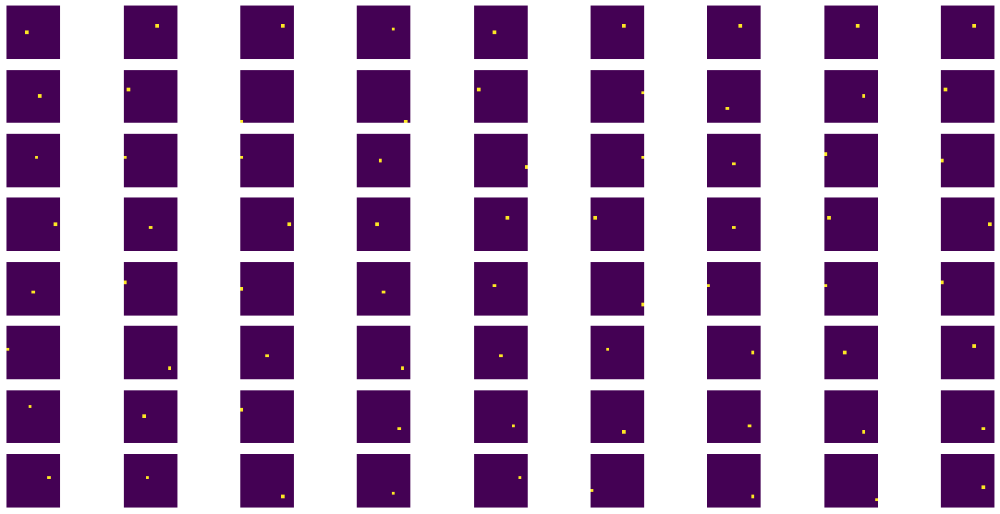

In [33]:
plt.figure(figsize=(20,10))
depth = 8
heads = 9
nonloc = []
model.eval()
for k in range(0, depth):
    with torch.no_grad():
        model((inputs[0].unsqueeze(0).to(device)), k=k)
        nonloc.append(model.net.attention_map[0])
        for i in range(heads):
            plt.subplot(depth,heads,k*heads+i+1)
            plt.imshow((model.net.attention_map[1][i][251]+1e-9).reshape(inputs.shape[2]//16,(inputs.shape[3])//16).abs().cpu().detach().numpy())
            plt.axis('off')
        
plt.show()

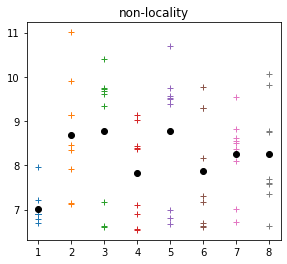

In [34]:
depth = 8
heads = 9
fig = plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
for i in range(0, depth):
    plt.plot((i+1)*np.ones(heads),nonloc[i].cpu().numpy(),'+')
    plt.plot(i+1, nonloc[i].mean().detach().cpu().numpy(),'ko')    
plt.title('non-locality')    
plt.show()

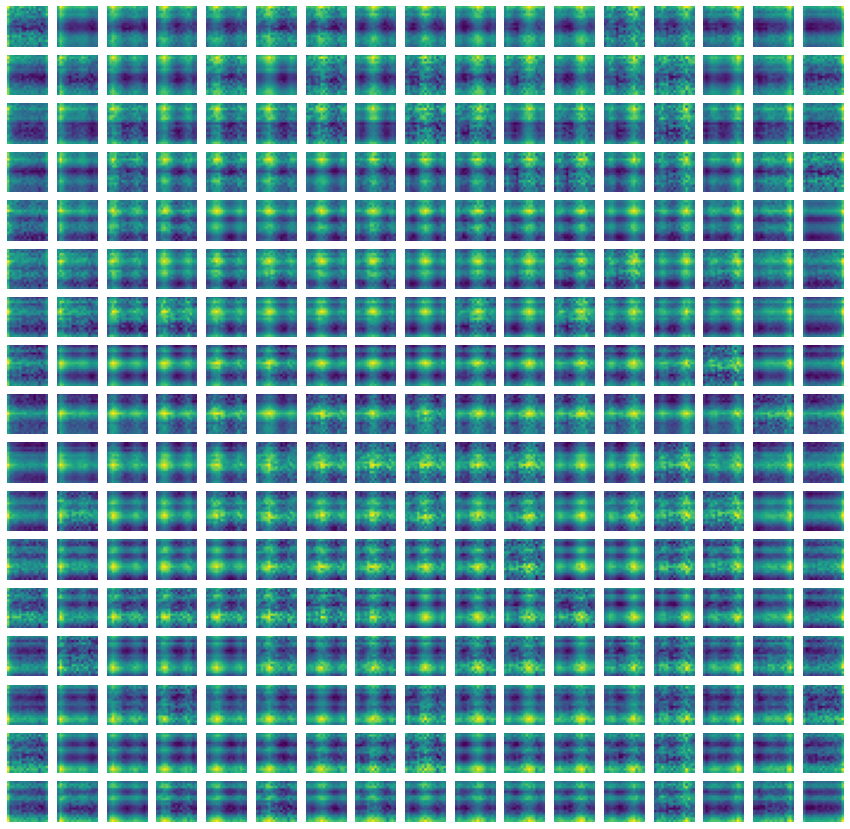

In [35]:
plt.figure(figsize=(15,15))

def plot_posenc(model):
    """Plot cosine similarity of learned pos. encoding"""
    q = model.pos_embed.flatten(2).transpose(1, 2)
    q = (q/(torch.norm(q, dim=-1)).unsqueeze(-1)).squeeze(0)
    q = (q@q.T)
    _, _, h, w = model.pos_embed.shape
    
    for i in range(h*w):
        plt.subplot(h,w,i+1)
        plt.imshow(q[i,:].reshape(h,w).cpu().detach().numpy())
        plt.axis('off')
#         plt.colorbar()
    return q
q = plot_posenc(model.net)

In [36]:
# Save model
net = model.net
checkpoint = {
    'model' :  ReconNet(net),
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
}
torch.save(checkpoint, './Models/imgnet_pretrain_acc_150M.pth')

In [37]:
torch.save(train_hist,'./Loss Curves/imgnet_pretrain_acc_150M.pt')

In [11]:
train_hist = torch.load('./Loss Curves/imgnet_pretrain_150M_train.pt')

In [49]:
train_hist

[0.005582204997097569, 0.004, 0.0034741737776126705]

In [12]:
train_hist.append(0.004)